<a href="https://colab.research.google.com/github/TimurRakhmat/ML/blob/main/lab1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Лабораторная работа № 1

Группа М8О-109СВ-24\n

Рахматуллин Тимур Сергеевич


In [2]:
import numpy as np
import matplotlib.pyplot as plt

In [38]:
def plot_function(function, true_optimum, found_optimum, x_bounds, y_bounds, name):
    x = np.linspace(x_bounds[0], x_bounds[1], 100)
    y = np.linspace(y_bounds[0], y_bounds[1], 100)
    X, Y = np.meshgrid(x, y)
    Z = function(X, Y)



    fig = plt.figure(figsize=(x_bounds[1] - x_bounds[0], y_bounds[1] - y_bounds[0]))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='k', alpha=0.3)

    for point in true_optimum:
      true_z = function(*point)
      ax.scatter(*point, true_z, color='red', s=30, label="Analytical Optimum")

    for i, opt in enumerate(found_optimum):
        z = function(*opt)
        ax.scatter(opt[0], opt[1], z, color='blue', s=30, label=f"Found Optimum {i+1}")

    ax.set_title(name)
    ax.set_xlabel('X')
    ax.set_ylabel("Y")
    ax.set_zlabel("f(X, Y)")
    ax.view_init(60, 30, 45)
    ax.legend()

    plt.show()

Функция Матьяса

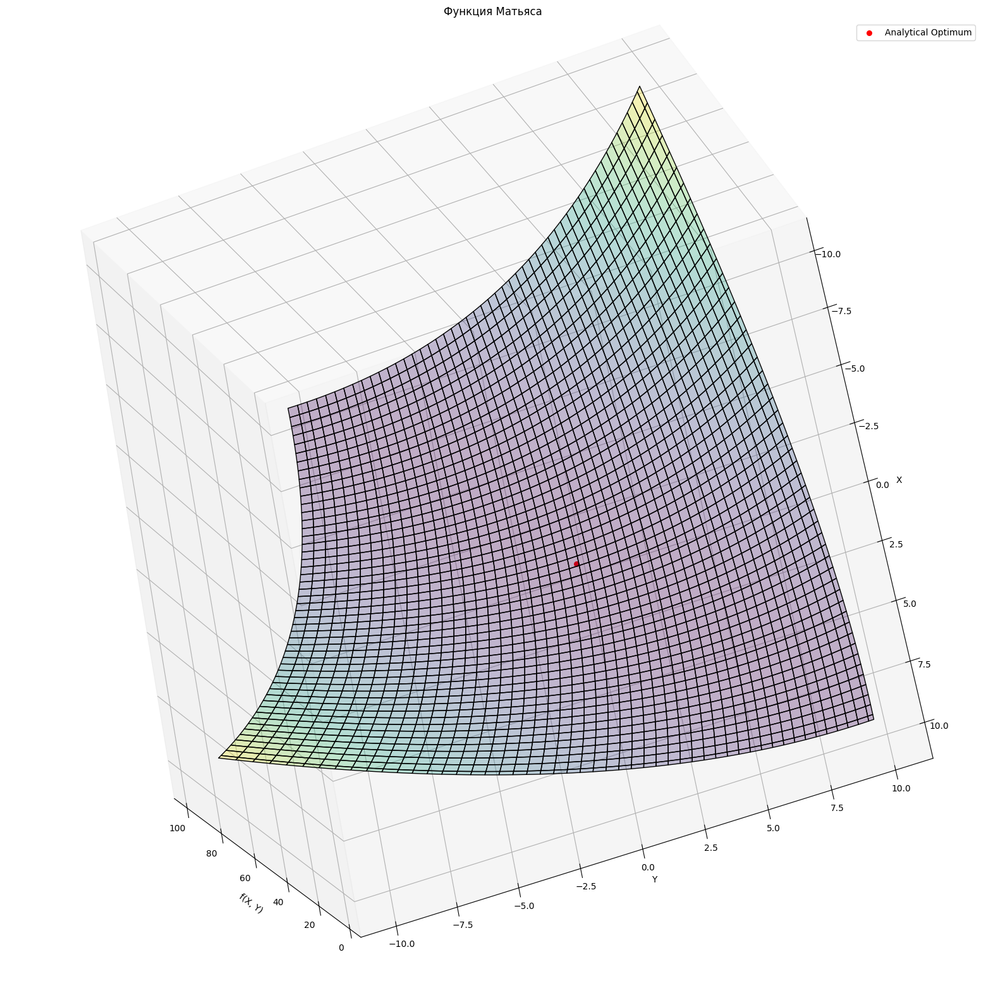

In [22]:
def matias(x, y):
    return 0.26 * (x**2 + y**2) - 0.48*x*y
def dmatias(x, y):
    dx = 0.26*2*x - 0.48*y
    dy = 0.26*2*y - 0.48*x
    return np.array([dx, dy])
matias_extr = [[0, 0]]
plot_function(matias, matias_extr, [], [-10, 10], [-10, 10], 'Функция Матьяса')

Функция Химмельблау

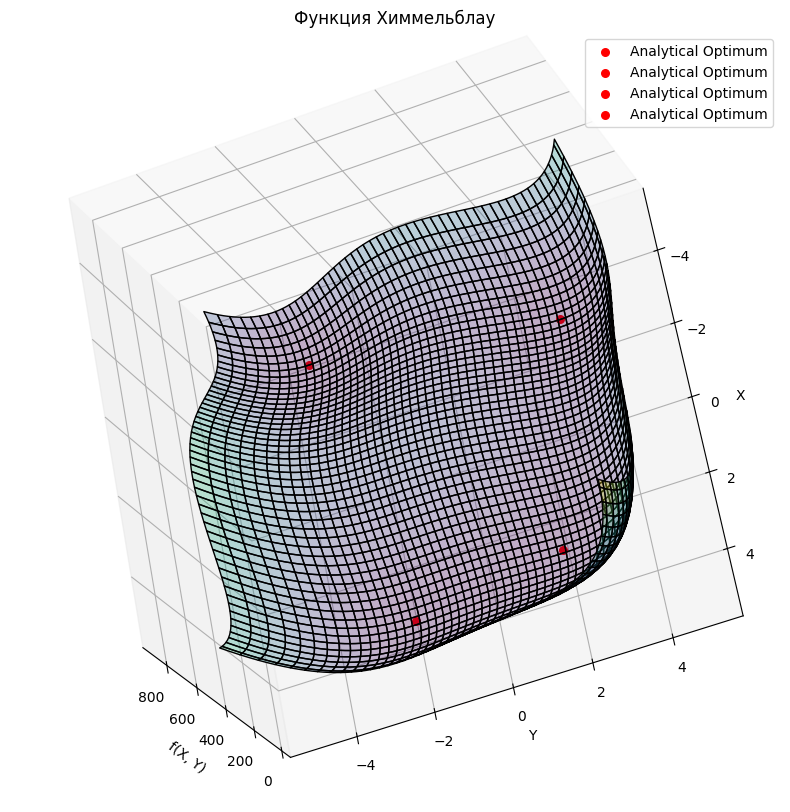

In [47]:
def himel(x, y):
    return (x ** 2 + y - 11)**2 + (x + y**2 - 7)**2

def dhimel(x, y):
    dx = 2*x*2*(x ** 2 + y - 11) + 2*(x + y**2 - 7)
    dy = 2*(x ** 2 + y - 11) + 2*y*2*(x + y**2 - 7)
    return np.array([dx, dy])
himel_extr = [[3, 2], [-2.805118,3.131312], [-3.779310,-3.283186], [3.584428,-1.848126]]
plot_function(himel, himel_extr, [], [-5, 5], [-5, 5], 'Функция Химмельблау')

In [57]:
def gradient_descent(grad, start_point, learning_rate=0.001, iterations=1000):
    point = np.array(start_point, dtype='float64')
    for _ in range(iterations):
        gradient = grad(point[0], point[1])
        point = point - learning_rate * gradient
    return point

In [52]:
def calculate_error(analytical_solution, numerical_solution):
    minEr = []
    for point in analytical_solution:
      absolute_error = np.linalg.norm(numerical_solution - point)
      minEr.append(absolute_error)
    print(f"absolute_error {min(minEr)}")

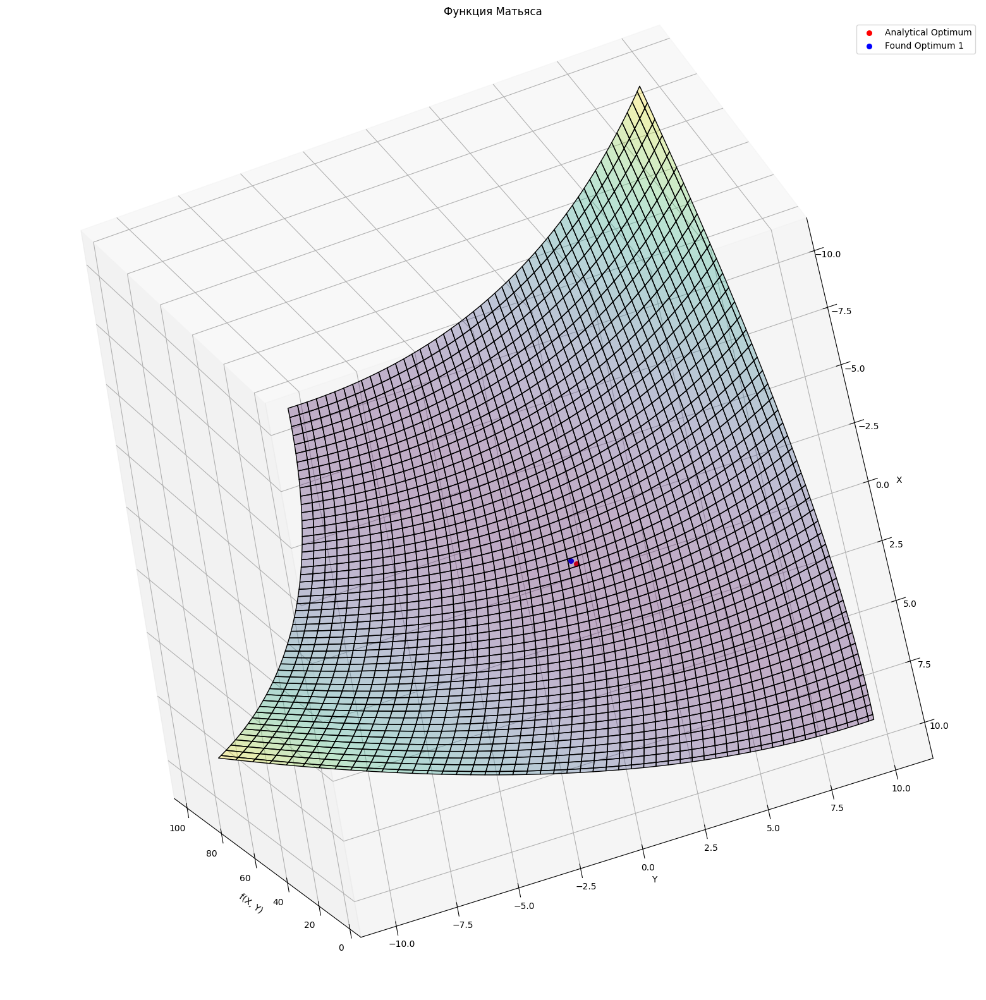

The extremum point is [-0.19215773 -0.19215773]
absolute_error 0.27175207367926757


In [58]:
matias_point = gradient_descent(dmatias, [-0.2, -0.2])

plot_function(matias, matias_extr, [matias_point], [-10, 10], [-10, 10], 'Функция Матьяса')
print(f"The extremum point is {matias_point}")
calculate_error(matias_extr, matias_point)

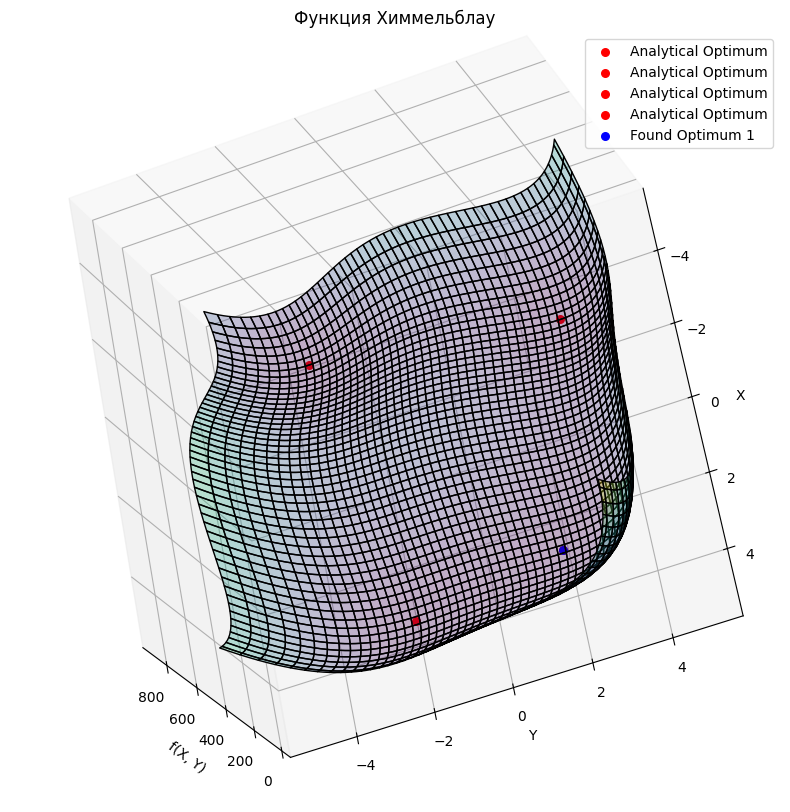

The extremum point is [3. 2.]
absolute_error 7.496652259970938e-12


In [59]:
himel_point = gradient_descent(dhimel, [0, 0])

plot_function(himel, himel_extr, [himel_point], [-5, 5], [-5, 5], 'Функция Химмельблау')
print(f"The extremum point is {himel_point}")
calculate_error(himel_extr, himel_point)

In [60]:
def plot_function_trace(function, true_optimum, found_optimum, x_bounds, y_bounds, name):
    x = np.linspace(x_bounds[0], x_bounds[1], 100)
    y = np.linspace(y_bounds[0], y_bounds[1], 100)
    X, Y = np.meshgrid(x, y)
    Z = function(X, Y)



    fig = plt.figure(figsize=(x_bounds[1] - x_bounds[0], y_bounds[1] - y_bounds[0]))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='k', alpha=0.3)

    for point in true_optimum:
      true_z = function(*point)
      ax.scatter(*point, true_z, color='red', s=30, label="Analytical Optimum")

    for i, (x, y) in enumerate(found_optimum):
        z = function(x, y)
        ax.scatter(x, y, z, color='blue', s=3)
        if i > 0:
            ax.plot(
                [found_optimum[i-1][0], x],
                [found_optimum[i-1][1], y],
                [function(*found_optimum[i-1]), z],
                color='orange',
                linewidth=1.5,
                alpha=0.8,
            )

    ax.set_title(name)
    ax.set_xlabel('X')
    ax.set_ylabel("Y")
    ax.set_zlabel("f(X, Y)")
    ax.view_init(60, 30, 45)
    ax.legend()

    plt.show()

In [61]:
def gradient_descent_with_trajectory(grad, start_point, learning_rate=0.001, iterations=1000):
    point = np.array(start_point, dtype='float64')
    trajectory = [point.copy()]
    for _ in range(iterations):
        gradient = grad(point[0], point[1])
        point = point - learning_rate * gradient
        trajectory.append(point.copy())
    return point, trajectory

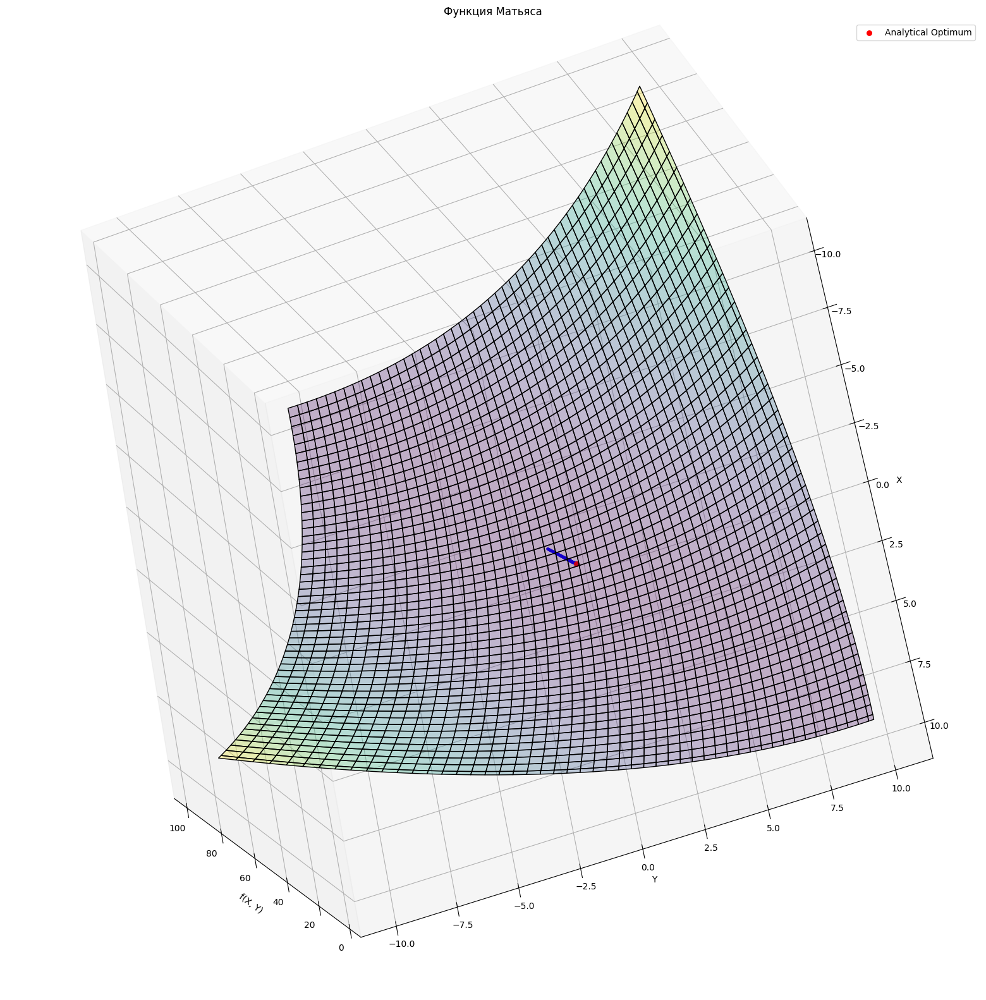

The extremum point is [-0.01816931 -0.01816931]
absolute_error 0.025695283964185474


In [68]:
matias_point, trace = gradient_descent_with_trajectory(dmatias, [-1, -1], 0.1)

plot_function_trace(matias, matias_extr, trace, [-10, 10], [-10, 10], 'Функция Матьяса')
print(f"The extremum point is {matias_point}")
calculate_error(matias_extr, matias_point)

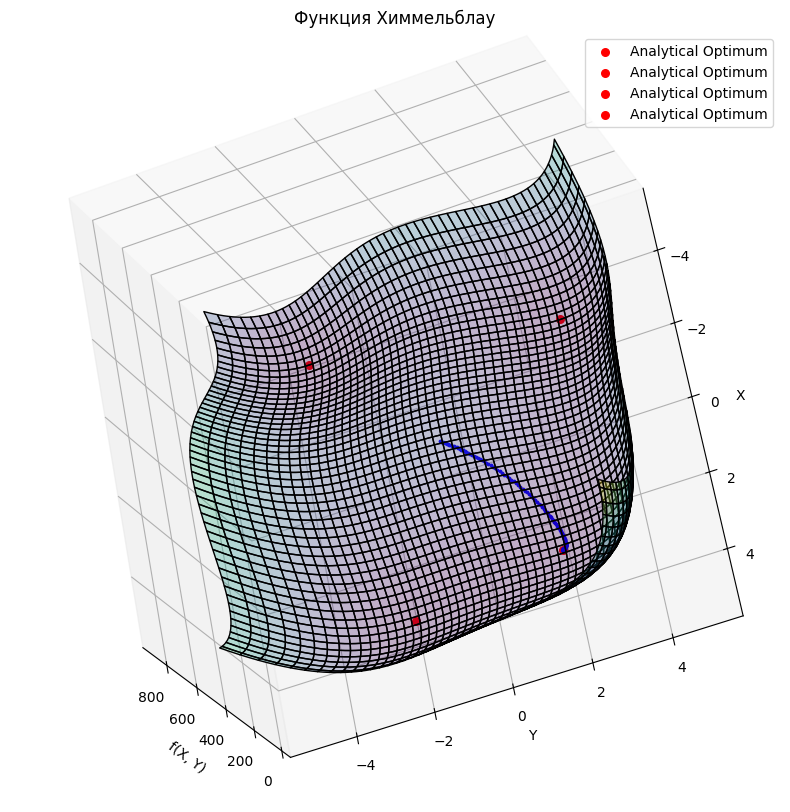

The extremum point is [3. 2.]
absolute_error 7.496652259970938e-12


In [65]:
himel_point, trace = gradient_descent_with_trajectory(dhimel, [0, 0])

plot_function_trace(himel, himel_extr, trace, [-5, 5], [-5, 5], 'Функция Химмельблау')
print(f"The extremum point is {himel_point}")
calculate_error(himel_extr, himel_point)

Моментная модификация градиентного спуска

In [73]:
def gradient_descent_moment(grad, start_point, learning_rate=0.001, iterations=1000000, momentum=0.6):
    point = np.array(start_point, dtype='float64')
    speed = np.zeros_like(point)
    for _ in range(iterations):
        gradient = grad(point[0], point[1])
        speed = momentum * speed - learning_rate * gradient
        point = point + speed
    return point

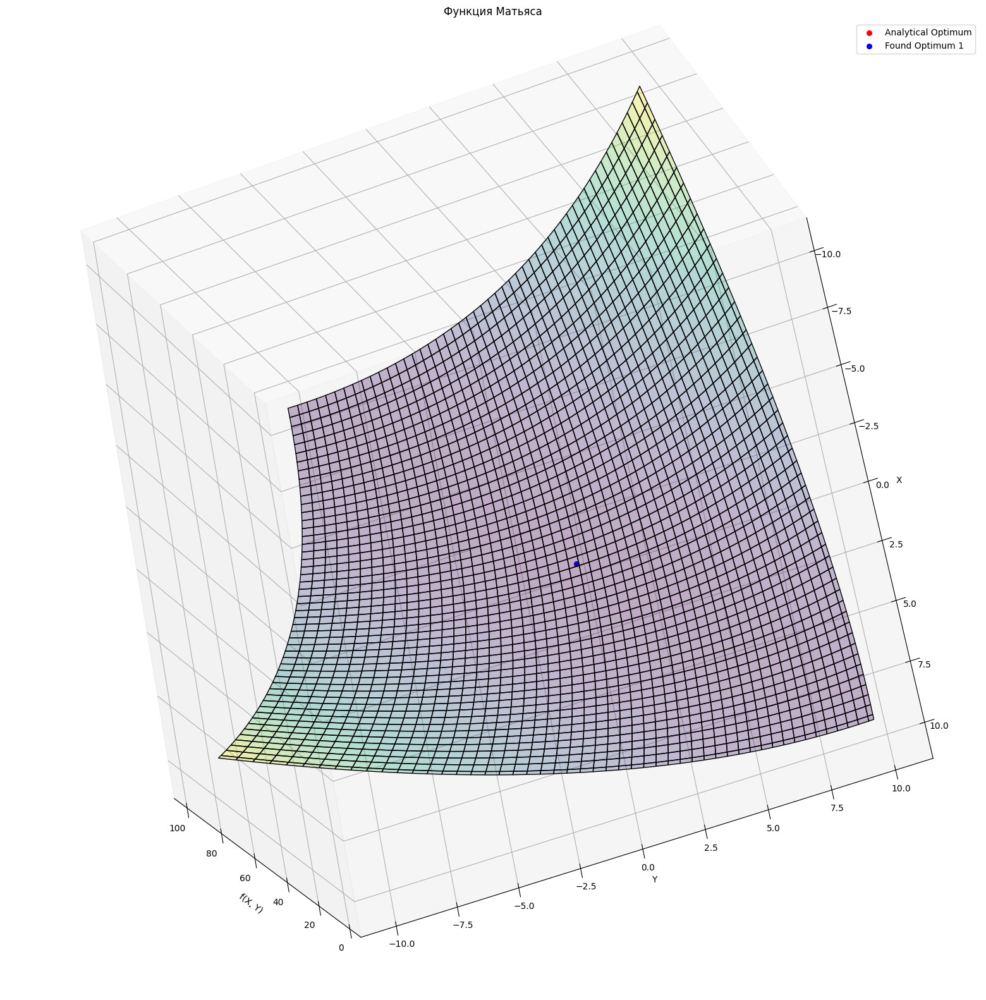

The extremum point is [-7.29386454e-45 -7.29386454e-45]
absolute_error 1.0315082161065148e-44


In [74]:
matias_point = gradient_descent_moment(dmatias, [-0.2, -0.2])

plot_function(matias, matias_extr, [matias_point], [-10, 10], [-10, 10], 'Функция Матьяса')
print(f"The extremum point is {matias_point}")
calculate_error(matias_extr, matias_point)

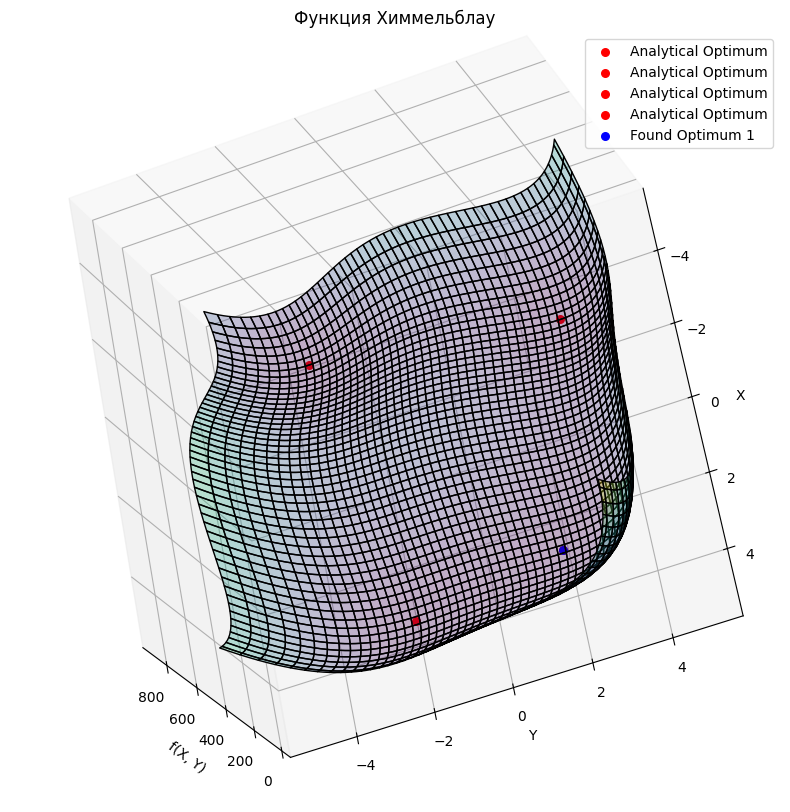

The extremum point is [3. 2.]
absolute_error 3.820199830714189e-15


In [75]:
himel_point = gradient_descent_moment(dhimel, [0, 0])

plot_function(himel, himel_extr, [himel_point], [-5, 5], [-5, 5], 'Функция Химмельблау')
print(f"The extremum point is {himel_point}")
calculate_error(himel_extr, himel_point)

Адаптивная модификация

In [76]:
def adagrad(gradient, start_point,  learning_rate=0.001, iterations=10000, epsilon=1e-8):
    point = np.array(start_point, dtype='float64')
    gradient_square_accum = np.zeros_like(point)

    for _ in range(iterations):
        grad = gradient(point[0], point[1])
        gradient_square_accum += grad**2
        adjusted_grad = grad / (np.sqrt(gradient_square_accum) + epsilon)
        point = point - learning_rate * adjusted_grad

    return point

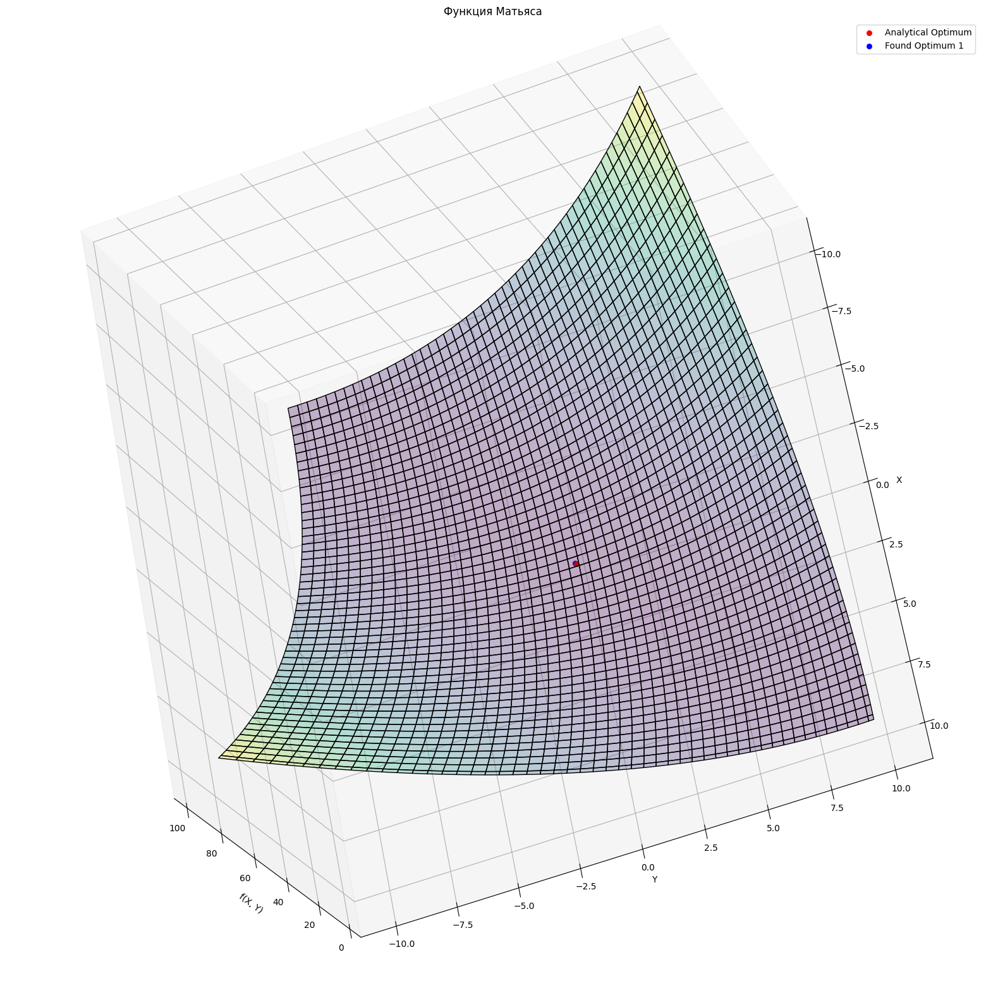

The extremum point is [-0.04683435 -0.04683435]
absolute_error 0.0662337731708739


In [77]:
matias_point = adagrad(dmatias, [-0.2, -0.2])

plot_function(matias, matias_extr, [matias_point], [-10, 10], [-10, 10], 'Функция Матьяса')
print(f"The extremum point is {matias_point}")
calculate_error(matias_extr, matias_point)

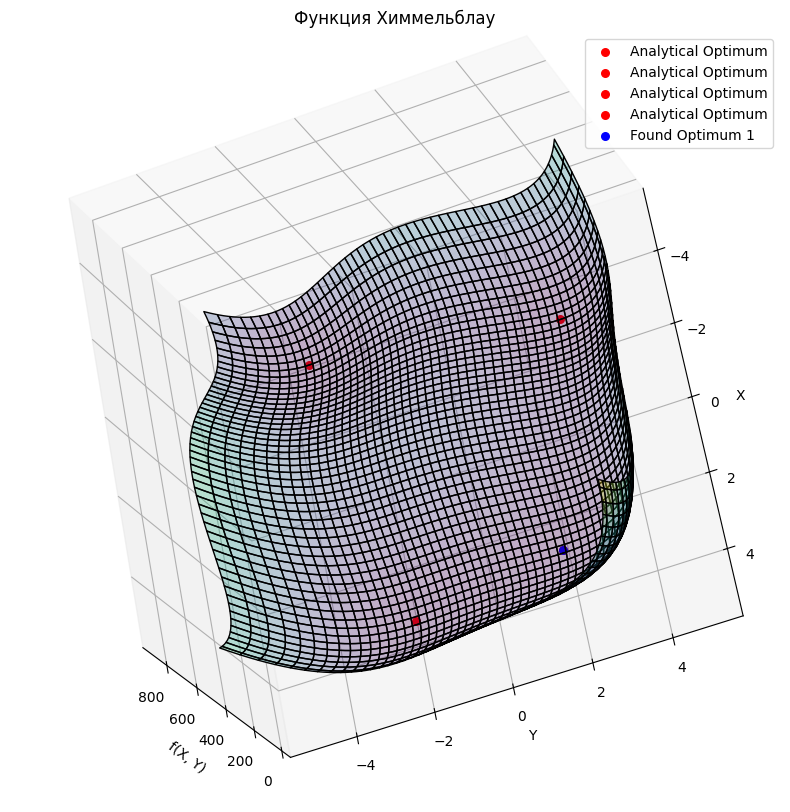

The extremum point is [2.99956232 2.00076547]
absolute_error 0.0008817618963203388


In [80]:
himel_point = adagrad(dhimel, [0, 0], 0.01, 100000)

plot_function(himel, himel_extr, [himel_point], [-5, 5], [-5, 5], 'Функция Химмельблау')
print(f"The extremum point is {himel_point}")
calculate_error(himel_extr, himel_point)

Метод эволюции темпа обучения

In [81]:
def gradient_descent_lowering(grad, start_point, initial_learning_rate=0.001, decay_rate=0.1, iterations=100000):
    point = np.array(start_point, dtype='float64')
    for t in range(1, iterations + 1):
        gradient = grad(point[0], point[1])
        learning_rate = initial_learning_rate / (1 + decay_rate * t)
        point = point - learning_rate * gradient
    return point

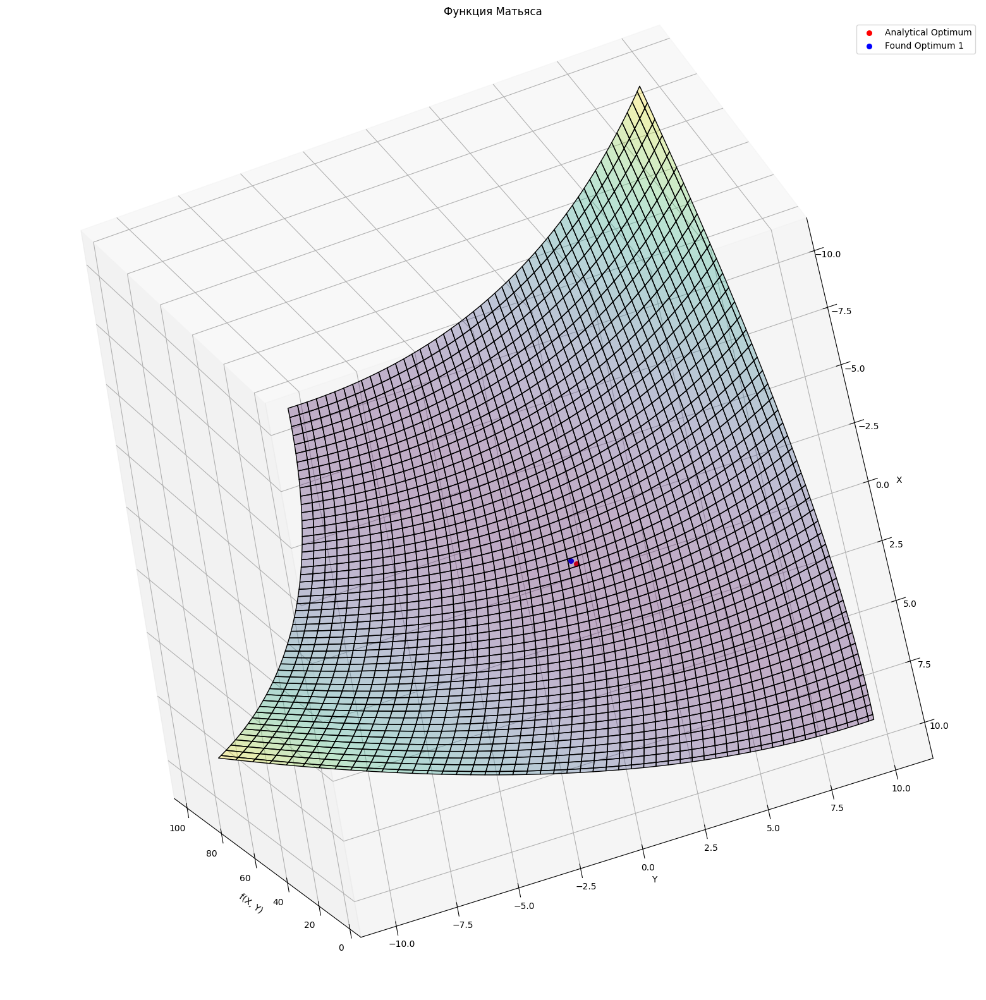

The extremum point is [-0.19926844 -0.19926844]
absolute_error 0.2818081268354124


In [82]:
matias_point = gradient_descent_lowering(dmatias, [-0.2, -0.2])

plot_function(matias, matias_extr, [matias_point], [-10, 10], [-10, 10], 'Функция Матьяса')
print(f"The extremum point is {matias_point}")
calculate_error(matias_extr, matias_point)

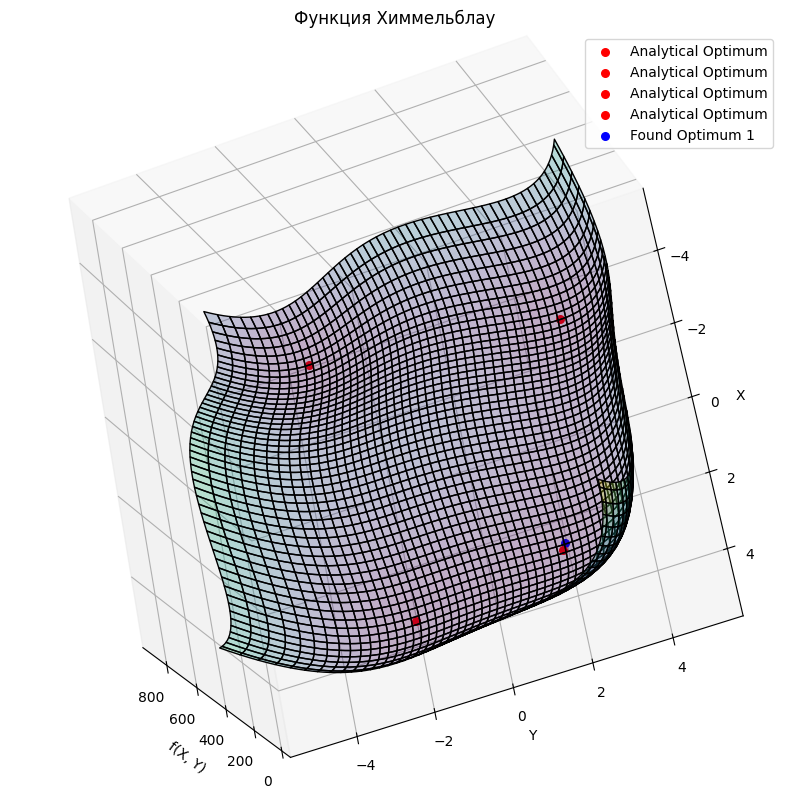

The extremum point is [2.85660723 2.09333301]
absolute_error 0.17109219296104103


In [83]:
himel_point = gradient_descent_lowering(dhimel, [0, 0])

plot_function(himel, himel_extr, [himel_point], [-5, 5], [-5, 5], 'Функция Химмельблау')
print(f"The extremum point is {himel_point}")
calculate_error(himel_extr, himel_point)

ВЫВОД:Хуже всего было адапитвное улучшение, лучше всего сработало моментное